In [87]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload
%config Completer.use_jedi = False

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [88]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import glob
import uuid
import pandas as pd
import seaborn as sns
from utils import *

There are 3 bead types:\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;0 - A type\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;1 - B type\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;2 - occupied B type\
Bonds can be formed only between [i, i+1] both type B. 

### Settings

In [49]:
prob_create = 0.1 # probility to create bond (convert pair [i, i+1] to type 2)
prob_break = 0.1 # probility to break bond (convert pair [i, i+1] to type 1)
prob_a_to_b = 0.1 # probility to convert bead (convert pair [i, i+1] to type 1)
prob_b_to_a = 0.1 # probility to break bond (convert pair [i, i+1] to type 1)
total_n=1000

### Simulation

We sweep parameter space, see for loops.
Matrices represent evolution of sequences during 10k steps: 0 - A type - dark blue, 1 - free B type - green, 2 - occupied B type - yellow. Time is along y axis, sequence is along x axis.

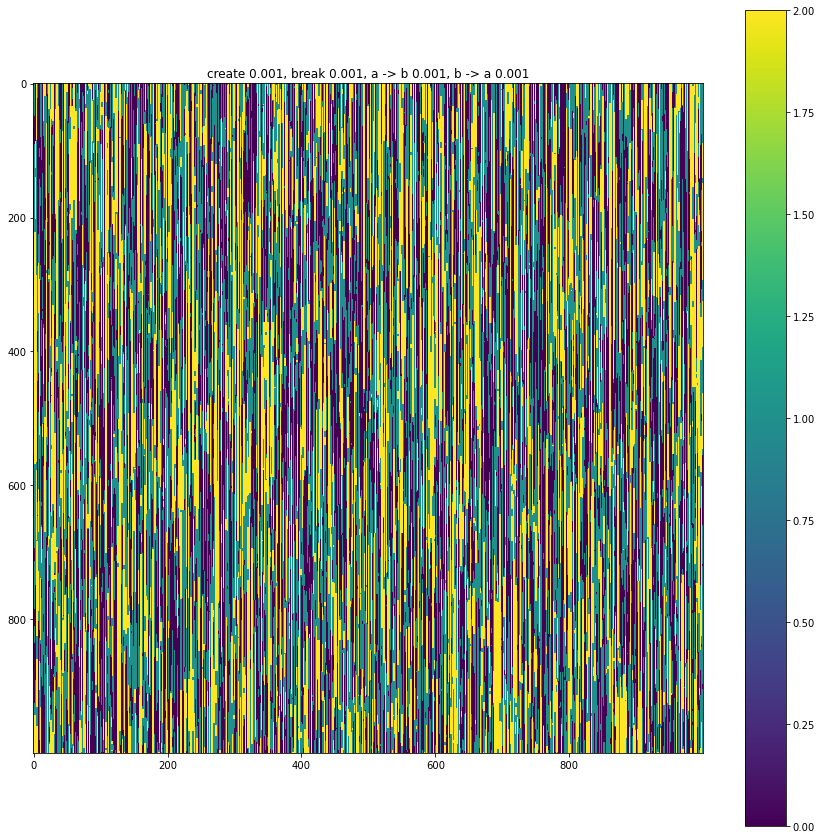

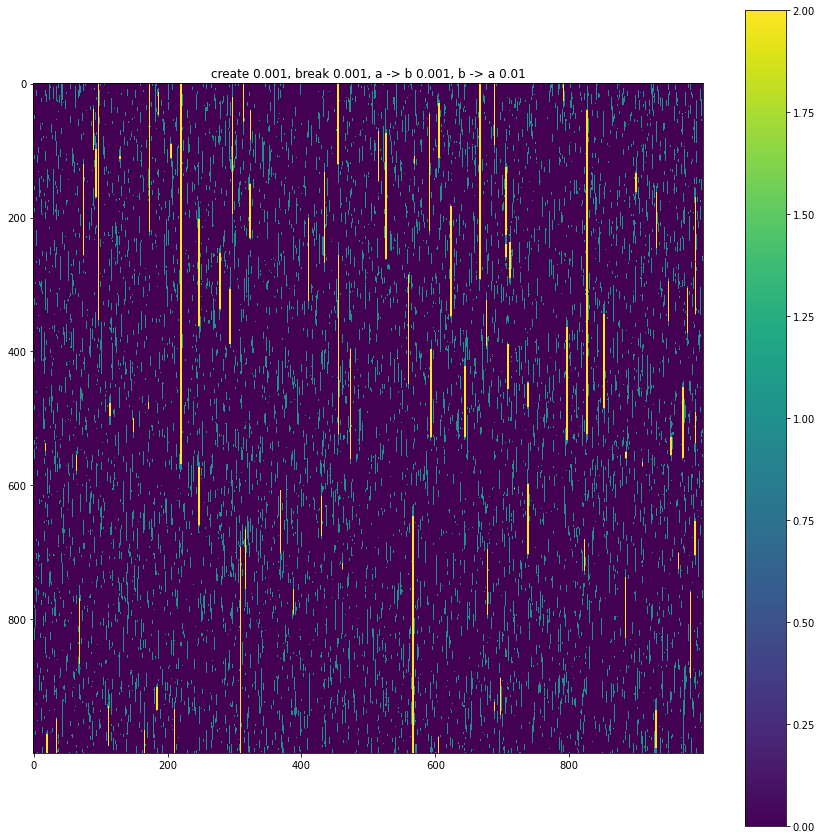

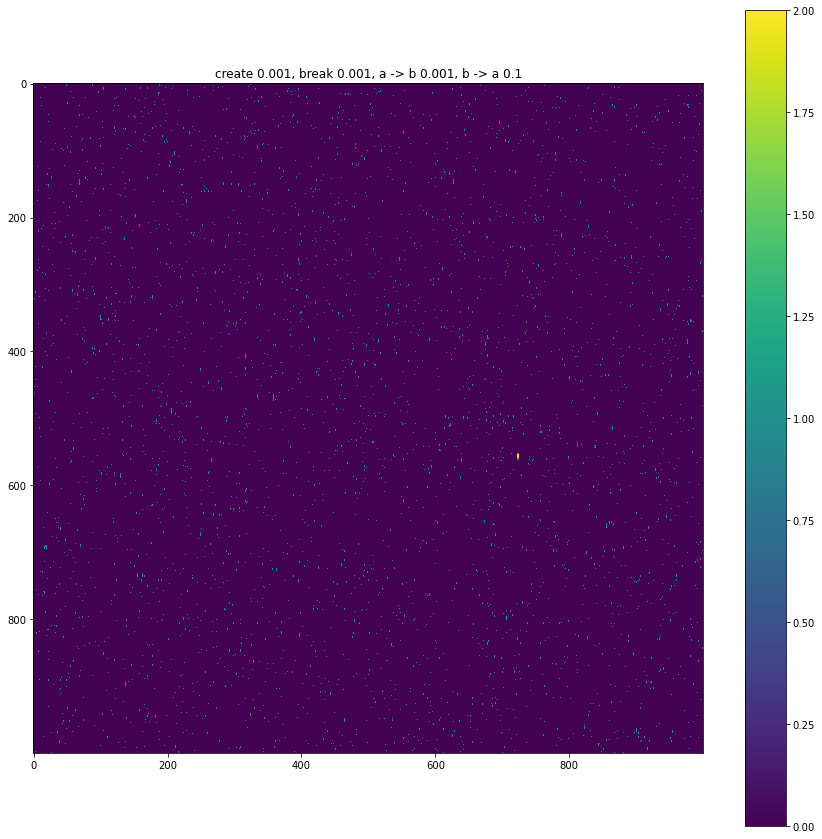

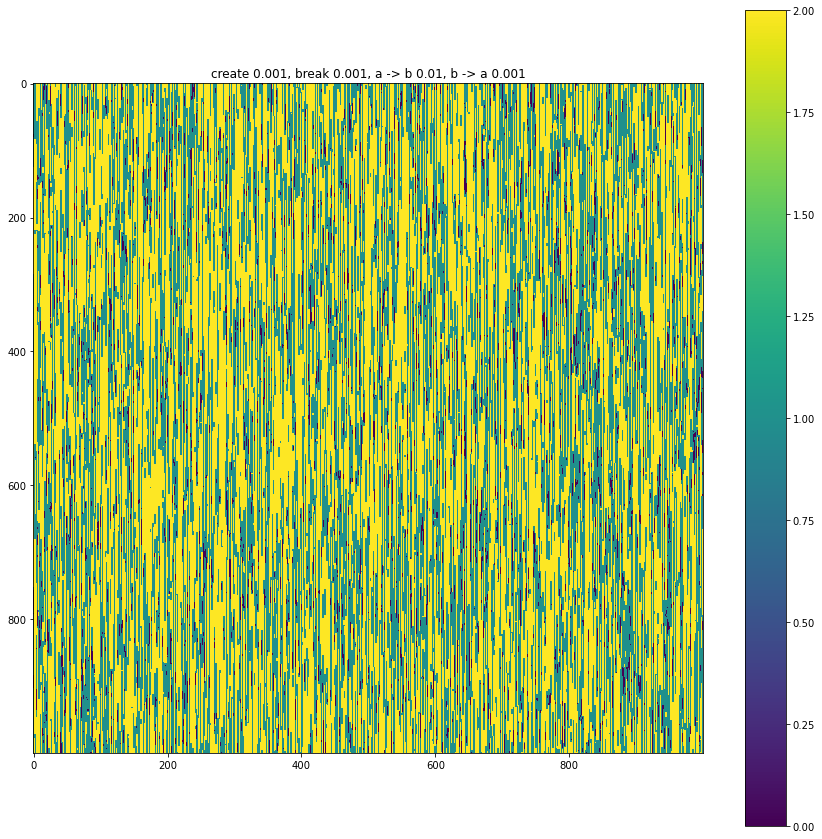

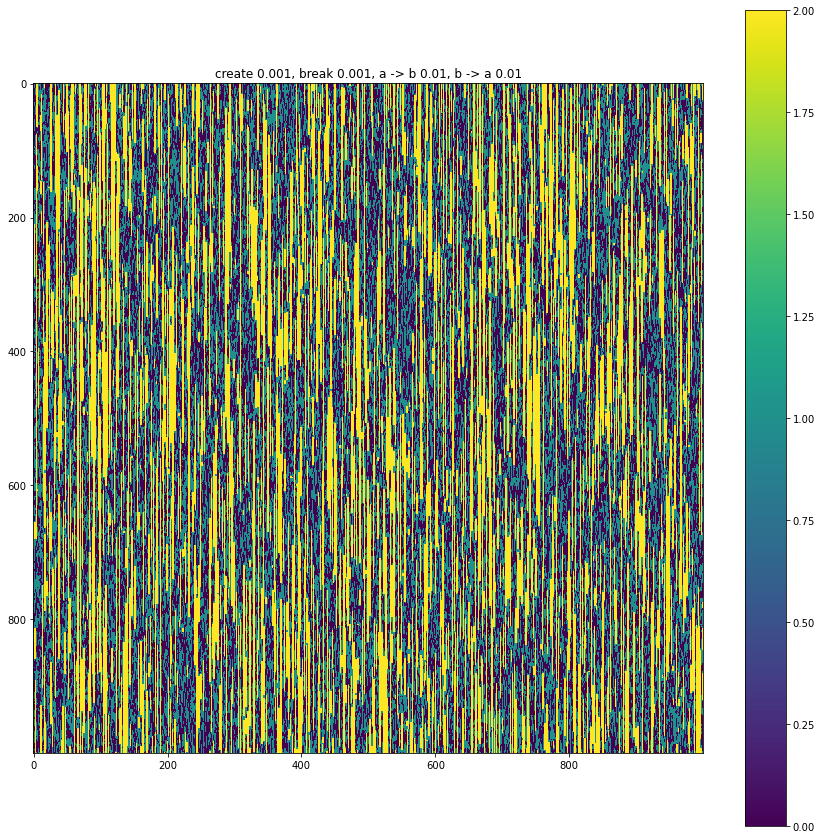

...

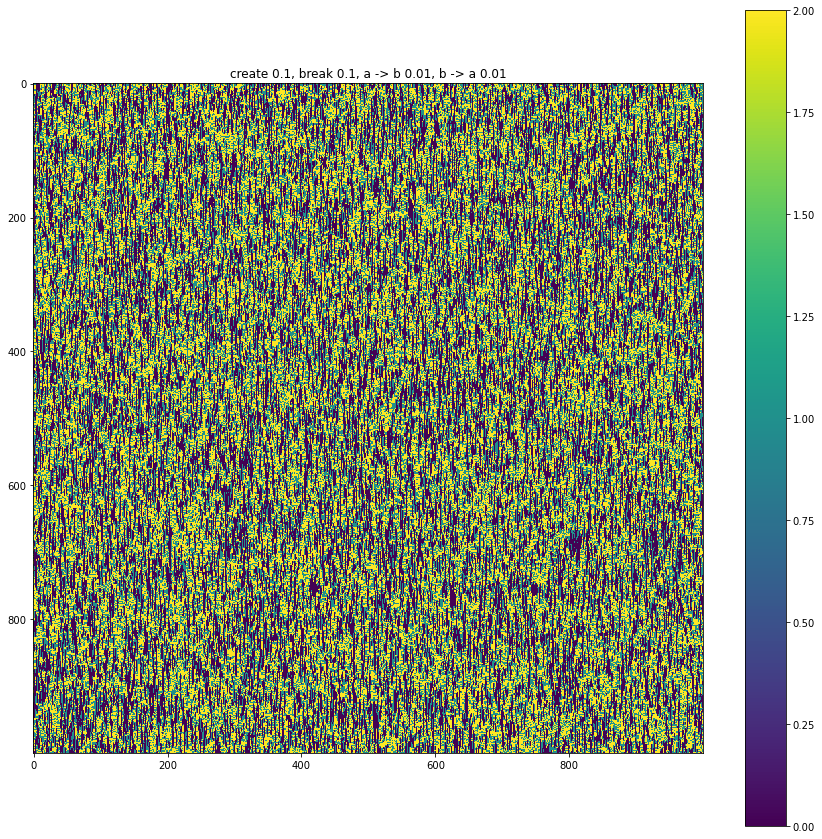

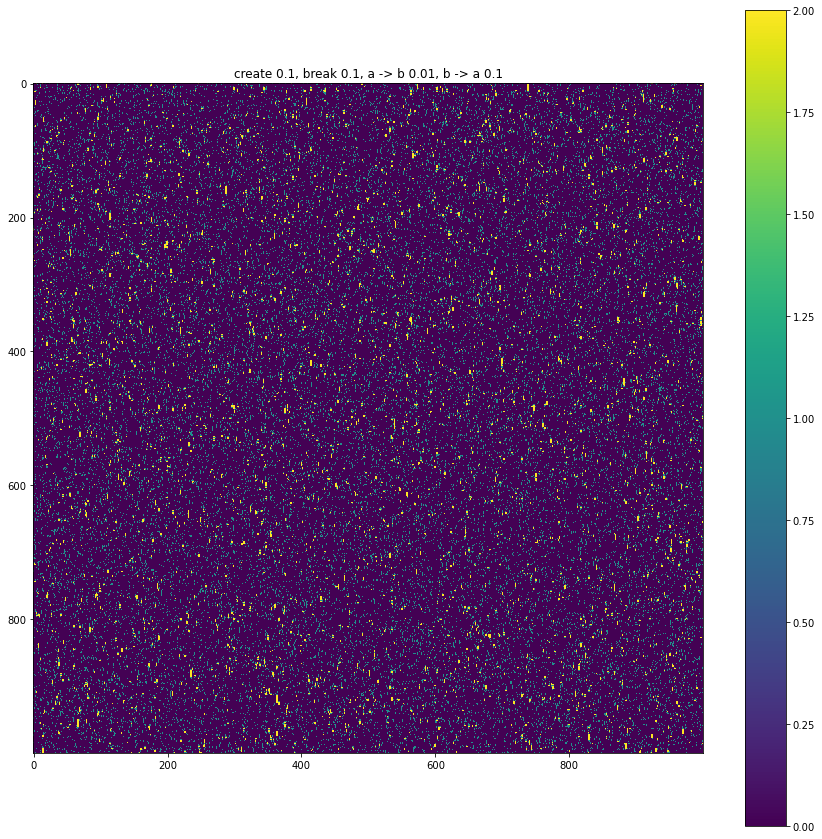

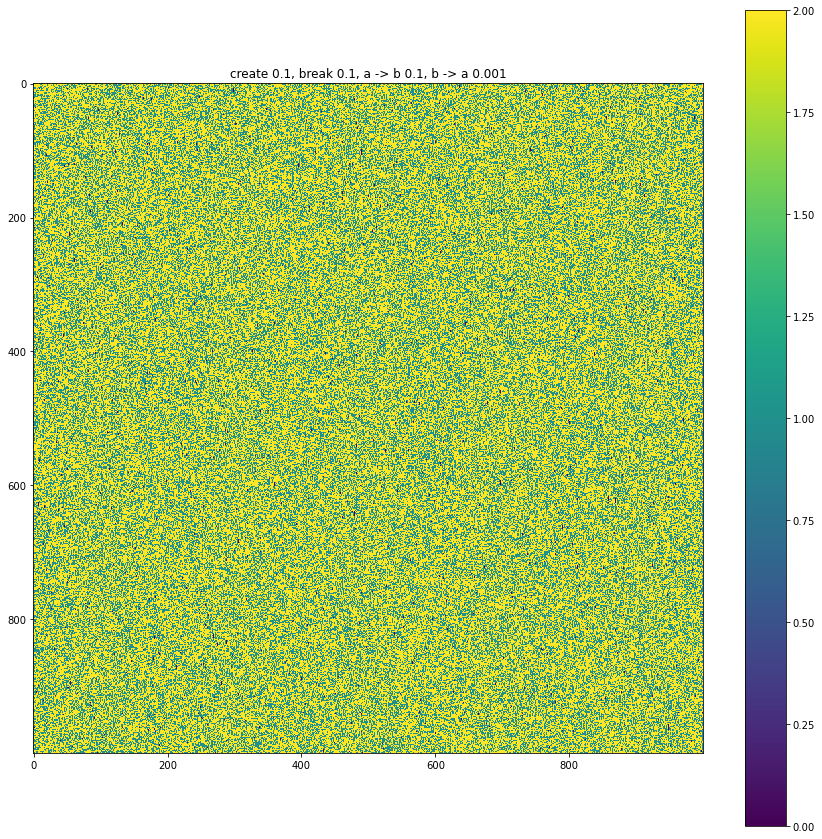

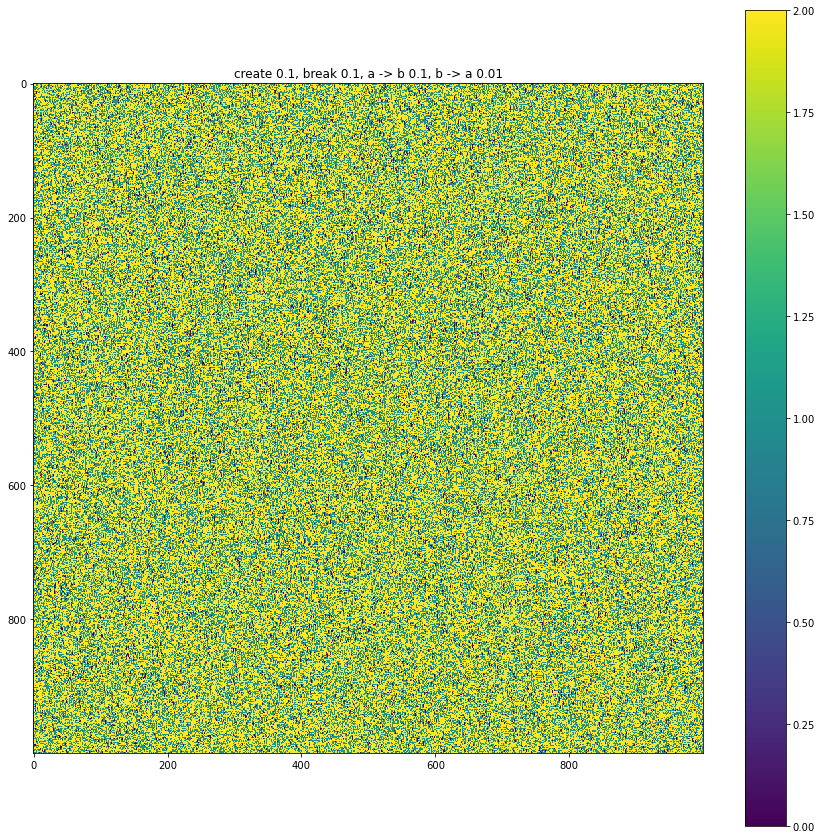

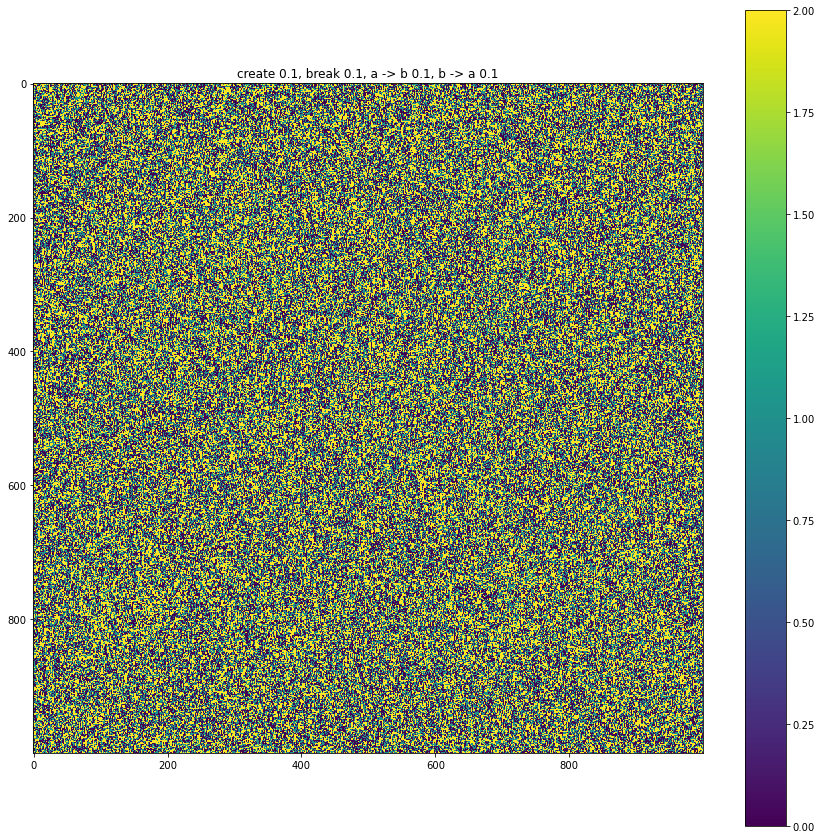

In [109]:
total_bwd={}
for prob_create in [0.001, 0.01, 0.1]:
    for prob_break in [0.001, 0.01, 0.1]:
        for prob_a_to_b in [0.001, 0.01, 0.1]:
            for prob_b_to_a in [0.001, 0.01, 0.1]:
                arr=np.zeros(total_n)
                total_bwd[f"{prob_create}_{prob_break}_{prob_a_to_b}_{prob_b_to_a}"] = [[],[],[]]
                mat=[]
                for i in range(10000):
                    step(arr, prob_create, prob_break, prob_a_to_b, prob_b_to_a)
                for i in range(1000):
                    for _ in range(10):
                        step(arr, prob_create, prob_break, prob_a_to_b, prob_b_to_a)
                    mat.append(np.copy(arr))
                    vals, _, lens = find_runs(arr)
                    total_bwd[f"{prob_create}_{prob_break}_{prob_a_to_b}_{prob_b_to_a}"][0].append(lens[vals==0].tolist())
                    total_bwd[f"{prob_create}_{prob_break}_{prob_a_to_b}_{prob_b_to_a}"][1].append(lens[vals==1].tolist())
                    total_bwd[f"{prob_create}_{prob_break}_{prob_a_to_b}_{prob_b_to_a}"][2].append(lens[vals==2].tolist())
                plt.figure(figsize=(15,15))
                plt.title(f"create {prob_create}, break {prob_break}, a -> b {prob_a_to_b}, b -> a {prob_b_to_a}")
                plt.imshow(mat, cmap='viridis', interpolation='None')
                plt.colorbar()
                plt.show()


Block-weight distributions of the all scanned systems.

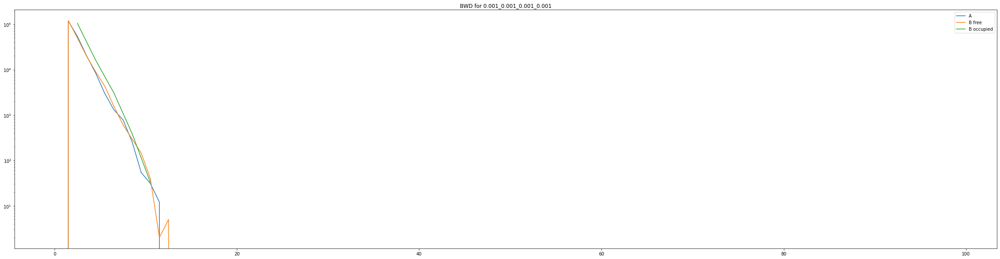

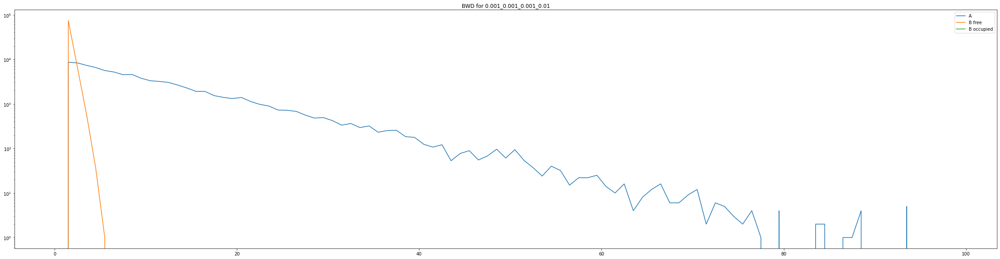

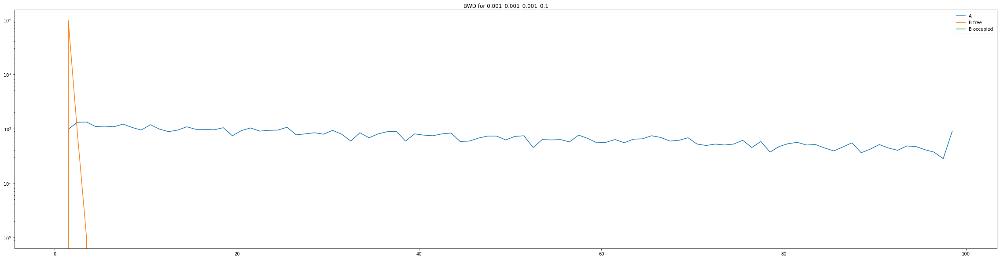

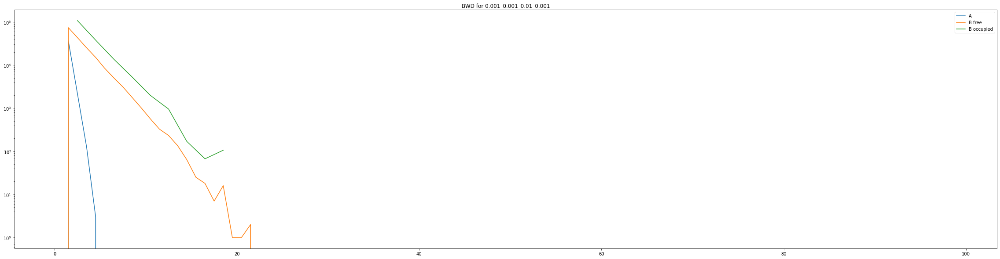

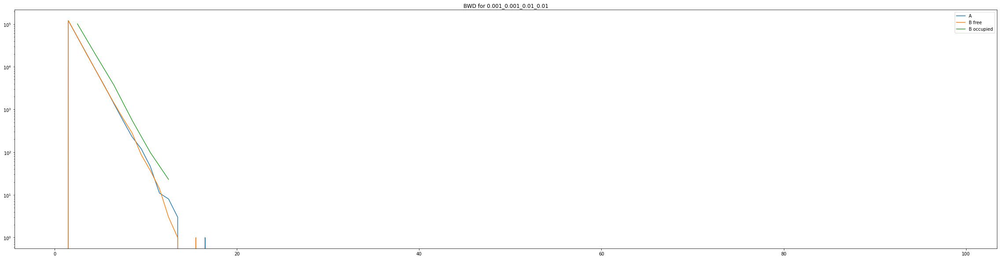

...

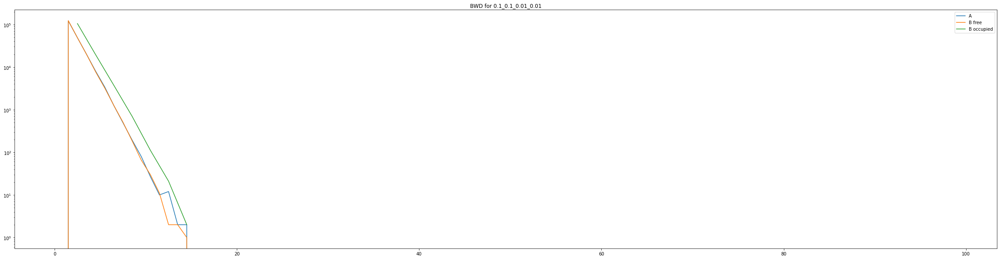

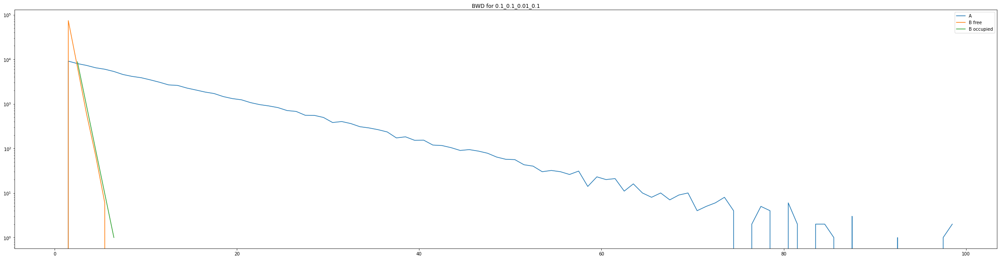

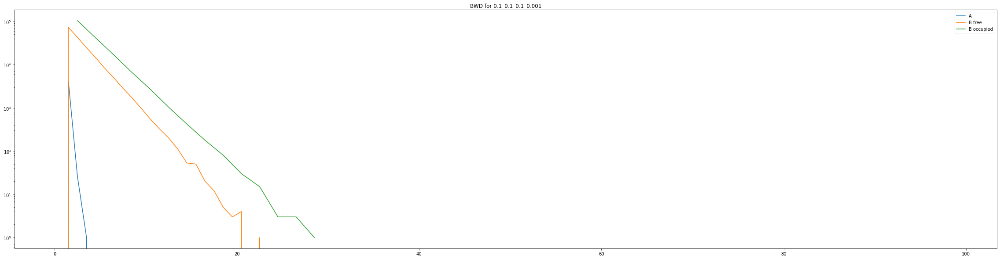

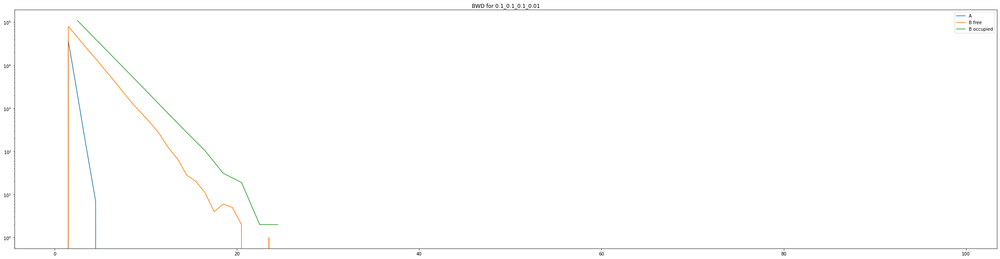

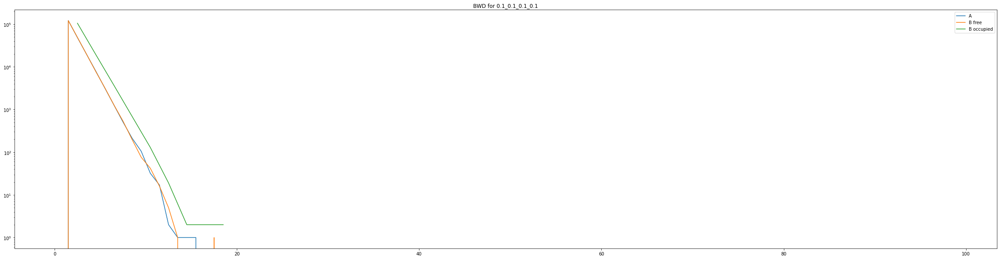

In [110]:
bins=np.arange(100)
for k in total_bwd.keys():
    plt.figure(figsize=(40,10))
    a_block, x = np.histogram(nested_list_comprehension(total_bwd[k][0]), bins=bins)
    x = (x[1:]+x[:-1])/2
    plt.plot(x, a_block ,label='A')
    b_block_unoc, _ = np.histogram(nested_list_comprehension(total_bwd[k][1]), bins=bins)
    plt.plot(x, b_block_unoc ,label='B free')
    b_block_oc, _ = np.histogram(nested_list_comprehension(total_bwd[k][2]), bins=bins)
    b_block_oc = b_block_oc.astype(float)
    x = x[np.where(b_block_oc!=0)]
    b_block_oc = b_block_oc[np.where(b_block_oc!=0)]
    
    plt.plot(x, b_block_oc ,label='B occupied')
    plt.title(f"BWD for {k}")
    plt.yscale('log')
    plt.legend()
    plt.show()
    